In [1]:
import sys

sys.path.append('.')

import model

In [2]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import pandas as pd
import random
import seaborn as sns
import statistics

This time, run the model with no contact tracing at all.

In [3]:
## Population parameters:
base_params = {
    # Node parameter
    'A' : 0.0, 
    
    # Edge parameter
    'W' : model.expected_one_per_edge, # probability of edge activation; 2/K
    'C' : 0.0,
    
    ## Disease parameters

    'beta_hat' : .4, # probability of transmission upon contact
    'alpha' : .25, # probability of exposed becoming infectious
    'gamma' : .1, # probability of infectious becoming recovered
    'zeta' : .1, # probability of infectious becoming symptomatic
                 # effective gamma = gamma + zeta - gamma * zeta

    ## Contact tracing parameters

    'limit' : 10, # number of time steps the contact tracing system remembers
}

In [4]:
N = 2000
K = 4

def watts_strogatz_case(p, **kwargs):
    print(p)
    g = nx.watts_strogatz_graph(N, K, p)
    
    g.graph['p'] = p
    
    return g, kwargs

In [5]:
conditions = {
    'p-0.000' : {'p' : 0.0000},
    'p-0.0005' : {'p' : 0.0005},
    'p-0.001' : {'p' : 0.001},
    'p-0.002' : {'p' : 0.002},
    'p-0.004' : {'p' : 0.004},
    'p-0.008' : {'p' : 0.008},
    'p-0.016' : {'p' : 0.016},
    'p-0.032' : {'p' : 0.032},
    'p-0.064' : {'p' : 0.064},
    'p-0.128' : {'p' : 0.128},
    'p-0.256' : {'p' : 0.256},
    'p-0.384' : {'p' : 0.384},
    'p-0.512' : {'p' : 0.512},
    'p-0.640' : {'p' : 0.640},
    'p-0.750' : {'p' : 0.750},
    'p-1.000' : {'p' : 1.000}
}

In [6]:
runs = 150

results = model.experiment(
    watts_strogatz_case,
    base_params,
    conditions,
    runs)

0.0
p-0.000
Trial 0
Trial 15 hits time step 100
Trial 63 hits time step 100
Trial 100
0.0005
p-0.0005
Trial 0
Trial 5 hits time step 100
Trial 30 hits time step 100
Trial 82 hits time step 100
Trial 100
0.001
p-0.001
Trial 0
Trial 4 hits time step 100
Trial 100
Trial 119 hits time step 100
0.002
p-0.002
Trial 0
Trial 51 hits time step 100
Trial 100
Trial 141 hits time step 100
0.004
p-0.004
Trial 0
Trial 100
0.008
p-0.008
Trial 0
Trial 100
Trial 104 hits time step 100
0.016
p-0.016
Trial 0
Trial 5 hits time step 100
Trial 57 hits time step 100
Trial 82 hits time step 100
Trial 83 hits time step 100
Trial 92 hits time step 100
Trial 100
Trial 136 hits time step 100
Trial 144 hits time step 100
0.032
p-0.032
Trial 0
Trial 37 hits time step 100
Trial 38 hits time step 100
Trial 68 hits time step 100
Trial 83 hits time step 100
Trial 100
Trial 132 hits time step 100
Trial 137 hits time step 100
Trial 144 hits time step 100
Trial 145 hits time step 100
0.064
p-0.064
Trial 0
Trial 1 hits tim

Trial 56 hits time step 100
Trial 56 hits time step 200
Trial 59 hits time step 100
Trial 61 hits time step 100
Trial 61 hits time step 200
Trial 62 hits time step 100
Trial 67 hits time step 100
Trial 67 hits time step 200
Trial 68 hits time step 100
Trial 68 hits time step 200
Trial 71 hits time step 100
Trial 74 hits time step 100
Trial 74 hits time step 200
Trial 75 hits time step 100
Trial 75 hits time step 200
Trial 76 hits time step 100
Trial 76 hits time step 200
Trial 77 hits time step 100
Trial 79 hits time step 100
Trial 79 hits time step 200
Trial 82 hits time step 100
Trial 85 hits time step 100
Trial 85 hits time step 200
Trial 88 hits time step 100
Trial 88 hits time step 200
Trial 90 hits time step 100
Trial 90 hits time step 200
Trial 94 hits time step 100
Trial 94 hits time step 200
Trial 95 hits time step 100
Trial 95 hits time step 200
Trial 98 hits time step 100
Trial 98 hits time step 200
Trial 99 hits time step 100
Trial 100
Trial 100 hits time step 100
Trial 102

Trial 39 hits time step 100
Trial 40 hits time step 100
Trial 41 hits time step 100
Trial 42 hits time step 100
Trial 43 hits time step 100
Trial 43 hits time step 200
Trial 46 hits time step 100
Trial 46 hits time step 200
Trial 47 hits time step 100
Trial 51 hits time step 100
Trial 52 hits time step 100
Trial 55 hits time step 100
Trial 56 hits time step 100
Trial 57 hits time step 100
Trial 58 hits time step 100
Trial 59 hits time step 100
Trial 60 hits time step 100
Trial 61 hits time step 100
Trial 62 hits time step 100
Trial 63 hits time step 100
Trial 64 hits time step 100
Trial 67 hits time step 100
Trial 71 hits time step 100
Trial 71 hits time step 200
Trial 72 hits time step 100
Trial 73 hits time step 100
Trial 75 hits time step 100
Trial 77 hits time step 100
Trial 78 hits time step 100
Trial 78 hits time step 200
Trial 79 hits time step 100
Trial 79 hits time step 200
Trial 81 hits time step 100
Trial 87 hits time step 100
Trial 88 hits time step 100
Trial 90 hits time s

In [7]:
import pickle

In [8]:
results['p-0.000'][0][2]

In [9]:
[results[k] for k in results]

[[(43,
   {'A': 0.0,
    'W': <function model.expected_one_per_edge(g, e)>,
    'C': 0.0,
    'beta_hat': 0.4,
    'alpha': 0.25,
    'gamma': 0.1,
    'zeta': 0.1,
    'limit': 10},
   {0: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    1: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    2: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    3: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    4: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    5: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    6: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    7: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    8: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    9: defaultdict(<function model.traced_contacts.<locals>.<lambda>()>, {}),
    10: defaultdict(<function model.t

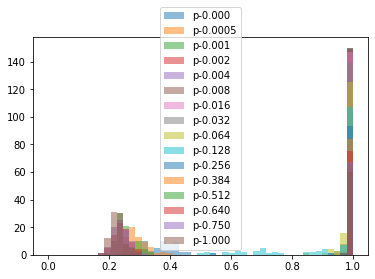

In [10]:
g = results['p-0.002'][0][2]
bins = np.linspace(0, 1, 50)

for case in results:
    plt.hist(
        [len(model.susceptible(r[2])) / N
         for r
         in results[case]],
        bins,
        alpha=.5,
        label=case)
    
plt.legend()

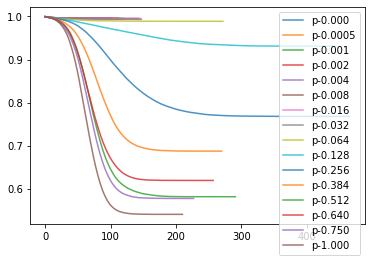

In [11]:
g = results['p-0.002'][0][2]
bins = np.linspace(0, len(g.nodes()), 50)

for case in results:
    plt.plot(
        model.average_susceptible_over_time(results[case]) / N,
        alpha=.8,
        label=case)
    
plt.legend()

In [12]:
def case_mean_susceptibles(records):
    return statistics.mean([
        len(model.susceptible(r[2]))
        for r
        in records
    ])

epidemic_size = {
    results[case][0][2].graph['p'] : case_mean_susceptibles(results[case])
    for case
    in results
}

In [13]:
def case_mean_susceptibles(records):
    return statistics.mean([
        len(model.susceptible(r[2]))
        for r
        in records
    ])

epidemic_size = {
    results[case][0][2].graph['p'] : case_mean_susceptibles(results[case]) / N
    for case
    in results
}

epidemic_size

{0.0: 0.9955233333333333,
 0.0005: 0.9953033333333333,
 0.001: 0.9954433333333333,
 0.002: 0.9957133333333333,
 0.004: 0.9960633333333334,
 0.008: 0.9953066666666666,
 0.016: 0.99537,
 0.032: 0.9933566666666667,
 0.064: 0.98873,
 0.128: 0.93092,
 0.256: 0.7678166666666667,
 0.384: 0.6873033333333333,
 0.512: 0.58141,
 0.64: 0.6192266666666667,
 0.75: 0.57738,
 1.0: 0.5405399999999999}

Text(0, 0.5, 'average final susceptible ratio')

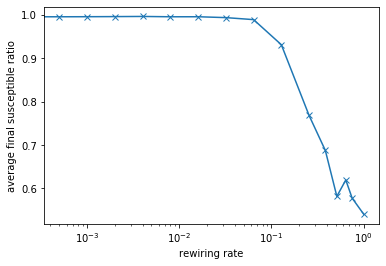

In [14]:
ax = plt.plot(list(epidemic_size.keys()),
              list(epidemic_size.values()),
              'x-'
        )

plt.xscale('log')
plt.xlabel('rewiring rate')
plt.ylabel('average final susceptible ratio')

In [15]:
def data_from_result(results, case):
    return [(r[1],
             {
                 "case" : case,
                 "p" : r[2].graph['p'],
                  "time" : r[0],
                  "s_final" : r[4][-1]
             }) 
            for r
            in results[case]]

def data_from_all_results(results):
    return [r for case in results for r in data_from_result(results, case)]

data = data_from_all_results(results)

data

[({'A': 0.0,
   'W': <function model.expected_one_per_edge(g, e)>,
   'C': 0.0,
   'beta_hat': 0.4,
   'alpha': 0.25,
   'gamma': 0.1,
   'zeta': 0.1,
   'limit': 10},
  {'case': 'p-0.000', 'p': 0.0, 'time': 43, 's_final': 1992}),
 ({'A': 0.0,
   'W': <function model.expected_one_per_edge(g, e)>,
   'C': 0.0,
   'beta_hat': 0.4,
   'alpha': 0.25,
   'gamma': 0.1,
   'zeta': 0.1,
   'limit': 10},
  {'case': 'p-0.000', 'p': 0.0, 'time': 33, 's_final': 1989}),
 ({'A': 0.0,
   'W': <function model.expected_one_per_edge(g, e)>,
   'C': 0.0,
   'beta_hat': 0.4,
   'alpha': 0.25,
   'gamma': 0.1,
   'zeta': 0.1,
   'limit': 10},
  {'case': 'p-0.000', 'p': 0.0, 'time': 26, 's_final': 1991}),
 ({'A': 0.0,
   'W': <function model.expected_one_per_edge(g, e)>,
   'C': 0.0,
   'beta_hat': 0.4,
   'alpha': 0.25,
   'gamma': 0.1,
   'zeta': 0.1,
   'limit': 10},
  {'case': 'p-0.000', 'p': 0.0, 'time': 60, 's_final': 1986}),
 ({'A': 0.0,
   'W': <function model.expected_one_per_edge(g, e)>,
   'C': 0

In [16]:
data_x = [r[1]['p'] for r in data]
data_y = [r[1]['s_final'] / N for r in data]

df = pd.DataFrame(data = {"p" : data_x, "s_final" : data_y})

In [17]:
df['log-p'] = np.log1p(df['p'])

In [18]:
df['log-p']

0       0.000000
1       0.000000
2       0.000000
3       0.000000
4       0.000000
          ...   
2395    0.693147
2396    0.693147
2397    0.693147
2398    0.693147
2399    0.693147
Name: log-p, Length: 2400, dtype: float64

[Text(0, 0.5, 'average final susceptible ratio'),
 None,
 Text(0.5, 0, 'rewiring rate')]

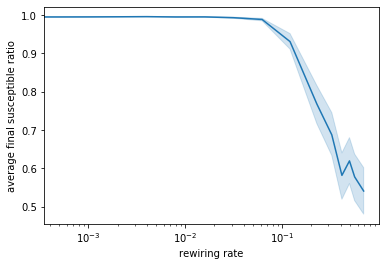

In [19]:
splot = sns.lineplot(x='log-p', y='s_final', data=df)
splot.set(xscale="log",
          xlabel='rewiring rate',
          ylabel='average final susceptible ratio')

## Finding the inflection point

Trying to find the inflection point. (What if there isn't one?)

In [67]:
x = np.array(list(epidemic_size.keys()))

In [68]:
y = np.array(list(epidemic_size.values()))

In [69]:
df1 = np.gradient(y,
            x,
            edge_order = 1)

In [70]:
np.gradient(df1, x, edge_order = 1)

array([ 7.20000000e+02,  7.16666667e+02,  4.62777778e+02, -5.63425926e+01,
       -7.63310185e+01, -2.58969907e+01,  5.24594907e+00, -6.74027054e+00,
       -8.80755389e+00, -6.36068839e+00,  1.16712782e+00,  2.67852783e+00,
        2.57852453e+00, -4.64599739e-01, -1.32466676e+00,  6.47400673e-01])

In [71]:
x[np.argsort(df1)]

array([1.28e-01, 2.56e-01, 3.84e-01, 0.00e+00, 6.40e-02, 7.50e-01,
       5.12e-01, 1.00e+00, 3.20e-02, 8.00e-03, 5.00e-04, 6.40e-01,
       1.60e-02, 4.00e-03, 2.00e-03, 1.00e-03])

In [72]:
inflection_points(np.array(list(epidemic_size.keys())),
                  np.array(list(epidemic_size.values())))

(0.128, 0.93092)

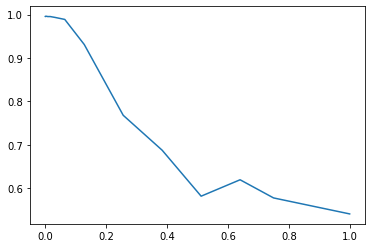

In [74]:
plt.plot(x, y)


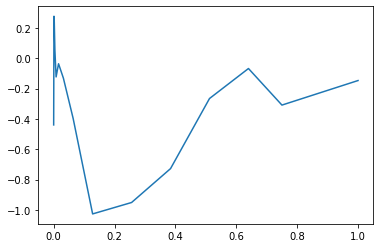

In [75]:
plt.plot(x, df1)


In [27]:
list(results['p-0.0005'][50][2].edges(data=True))[:5]

[(0, 1, {'w': 0.5, 'c': 0.0}),
 (0, 1999, {'w': 0.5, 'c': 0.0}),
 (0, 2, {'w': 0.5, 'c': 0.0}),
 (0, 1998, {'w': 0.5, 'c': 0.0}),
 (1, 2, {'w': 0.5, 'c': 0.0})]